In [12]:
from segmentation.findOptimalRotation import find_optimal_rotation
from segmentFunction import segment_dss_page
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from data_management.augmentation.commonAug import whitespaceRemover, imgResizer
from skimage.transform import rotate
from skimage.morphology import reconstruction, area_opening, skeletonize, medial_axis, area_closing


#gray = gray_img.copy()
#_, gray = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)




def find_number_of_lines2(img):

    blurryboi = img.copy()
    #blurryboi = cv2.GaussianBlur(blurryboi, (25, 25), 0)
    #blurryboi = area_opening(blurryboi, 100, connectivity=500)
    
    for i in range(2):
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,1))
        blurryboi = cv2.dilate(blurryboi, kernel, iterations=1)

        #kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9,3))
        blurryboi = cv2.erode(blurryboi, kernel, iterations=1)
    

    blurryboi = imgResizer(blurryboi, desired_size = 500)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    blurryboi = cv2.dilate(blurryboi, kernel, iterations=1)
    #blurryboi = cv2.GaussianBlur(blurryboi, (1, 15), 0)
    

    #blurryboi = cv2.resize(blurryboi, (400, 800))
    #blurryboi = cv2.GaussianBlur(blurryboi, (25, 25), 0)
    #_, blurryboi = cv2.threshold(blurryboi, 0, 255, cv2.THRESH_OTSU)
    

    rot_image, rot_line_peaks, rot_degree = find_optimal_rotation(blurryboi, "hi", lookahead=15, runmode=0)

    return blurryboi, rot_degree, rot_image



def find_number_of_lines3(img):

    blurryboi = img.copy()
    #blurryboi = cv2.GaussianBlur(blurryboi, (25, 25), 0)
    blurryboi = imgResizer(blurryboi, desired_size = 500)
    _, blurryboi = cv2.threshold(blurryboi, 0, 255, cv2.THRESH_OTSU)
    blurryboi = area_opening(blurryboi, 100, connectivity=500)
    
    
    #preskel = blurryboi.copy()
    preskel = blurryboi.copy()
    skeleton = skeletonize(cv2.bitwise_not(blurryboi))

    skeleton = skeleton * 255
    skeleton = skeleton.astype(np.uint8)
    blurryboi = skeleton

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10,1))
    #blurryboi = cv2.dilate(blurryboi, kernel, iterations=1)
    #blurryboi = cv2.GaussianBlur(blurryboi, (1, 15), 0)


    #blurryboi = cv2.resize(blurryboi, (400, 800))
    blurryboi = cv2.GaussianBlur(blurryboi, (11, 11), 0)
    
    

    rot_image, rot_line_peaks, rot_degree = find_optimal_rotation(blurryboi, "hi", lookahead=15, runmode=0)

    return blurryboi, rot_degree, rot_image




def find_number_of_lines5(img):

    blurryboi = img.copy()

    blurryboi = cv2.GaussianBlur(blurryboi, (9, 9), 0)
    #blurryboi = imgResizer(blurryboi, desired_size = 500)
    _, blurryboi = cv2.threshold(blurryboi, 0, 255, cv2.THRESH_OTSU)
    blurryboi = imgResizer(blurryboi, desired_size = 500)
    
    blurryboi = area_closing(blurryboi, 10, connectivity=500)

    img2 = blurryboi.copy()

    skel, distance = medial_axis(cv2.bitwise_not(img2), return_distance=True)
    dist_on_skel = distance * skel
    blurryboi = dist_on_skel

    blurryboi = cv2.GaussianBlur(blurryboi, (9, 9), 0)
    

    rot_image, rot_line_peaks, rot_degree = find_optimal_rotation(blurryboi, "hi", lookahead=15, runmode=0)

    return blurryboi, rot_degree, rot_image




def find_number_of_lines6(img):

    blurryboi = img.copy()

    
    #blurryboi = cv2.GaussianBlur(blurryboi, (5, 5), 0)
    blurryboi = imgResizer(blurryboi, desired_size = 500)
    #_, blurryboi = cv2.threshold(blurryboi, 0, 255, cv2.THRESH_OTSU)

    blurryboi = cv2.bitwise_not(blurryboi)
    blurryboi = area_opening(blurryboi, 10, connectivity=500)

    draw_img = np.zeros(blurryboi.shape)
    #blurryboi = cv2.GaussianBlur(blurryboi, (1, 15), 0)

    radius = 5
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    #blurryboi = cv2.morphologyEx(blurryboi, cv2.MORPH_DILATE, kernel)
    ret, labels = cv2.connectedComponents(blurryboi)
    contours, hierarchy = cv2.findContours(blurryboi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    for label in range(1, ret):
        component = np.uint8(labels == label) * 255
        contours, _ = cv2.findContours(component, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

        # filter out small or invalid bounding boxes
        for j,contour in enumerate(contours):
            (x, y, w, h) = cv2.boundingRect(contour)
            #print(x,y)
            cv2.circle(draw_img, (int(x+w/2), int(y+h/2)), radius, (255,255,255), 2)
            cv2.ellipse(draw_img, (int(x+w/2), int(y+h/2)), (int(w/2),int(h/2)), 0, 0, 360, (255,255,255), 1)


    #blurryboi = cv2.resize(blurryboi, (400, 800))
    blurryboi = cv2.GaussianBlur(draw_img, (11, 11), 0)
        

    rot_image, rot_line_peaks, rot_degree = find_optimal_rotation(blurryboi, "hi", lookahead=15, runmode=0)

    return blurryboi, rot_degree, rot_image

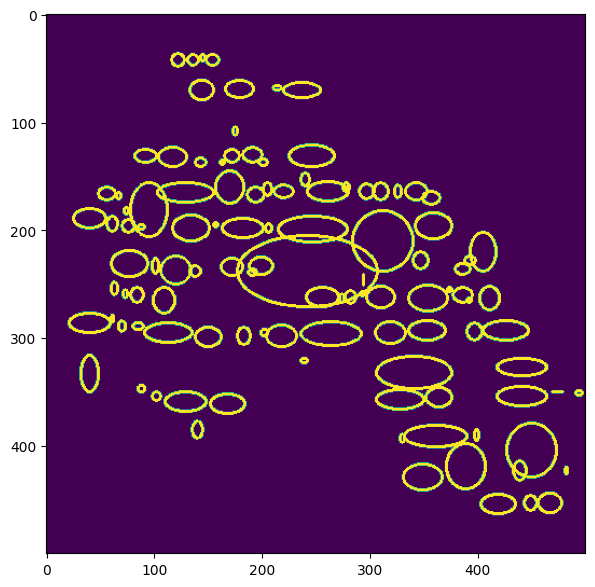

In [9]:
from skimage.morphology import medial_axis, skeletonize
import cv2
import numpy as np

pth = "image-data/P106-Fg002-R-C01-R01-binarized.jpg"

img = cv2.imread(pth, cv2.IMREAD_GRAYSCALE) #Read the img
img = whitespaceRemover(img=img, padding=100)


blurryboi = img.copy()

#blurryboi = cv2.GaussianBlur(blurryboi, (5, 5), 0)
blurryboi = imgResizer(blurryboi, desired_size = 500)
#_, blurryboi = cv2.threshold(blurryboi, 0, 255, cv2.THRESH_OTSU)

blurryboi = cv2.bitwise_not(blurryboi)
blurryboi = area_opening(blurryboi, 10, connectivity=500)

draw_img = np.zeros(blurryboi.shape)
#blurryboi = cv2.GaussianBlur(blurryboi, (1, 15), 0)

radius = 2
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
#blurryboi = cv2.morphologyEx(blurryboi, cv2.MORPH_DILATE, kernel)
ret, labels = cv2.connectedComponents(blurryboi)
contours, hierarchy = cv2.findContours(blurryboi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
for label in range(1, ret):
    component = np.uint8(labels == label) * 255
    contours, _ = cv2.findContours(component, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    # filter out small or invalid bounding boxes
    for j,contour in enumerate(contours):
        (x, y, w, h) = cv2.boundingRect(contour)
        #print(x,y)
        cv2.ellipse(draw_img, (int(x+w/2), int(y+h/2)), (int(w/2),int(h/2)), 0, 0, 360, (255,255,255), 2)


#blurryboi = cv2.resize(blurryboi, (400, 800))
blurryboi = cv2.GaussianBlur(blurryboi, (11, 11), 0)

plt.figure(figsize=(12,7))
plt.imshow(draw_img)
plt.show()

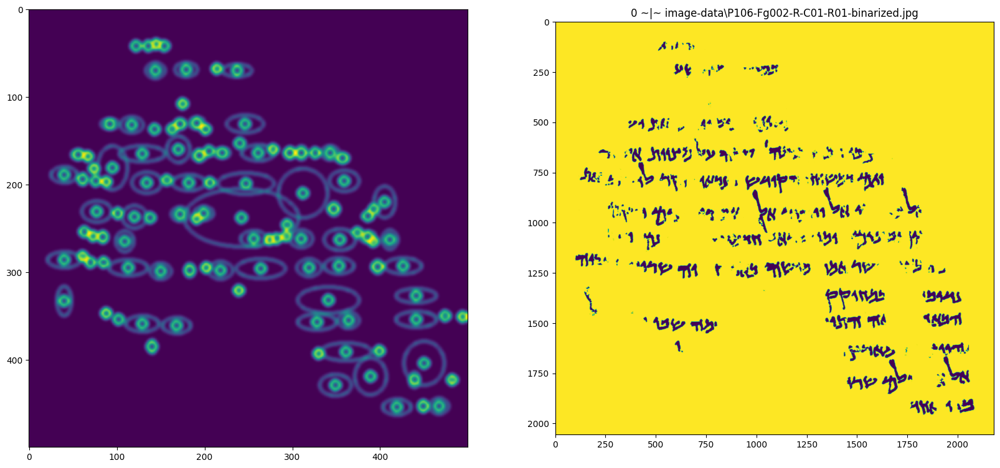

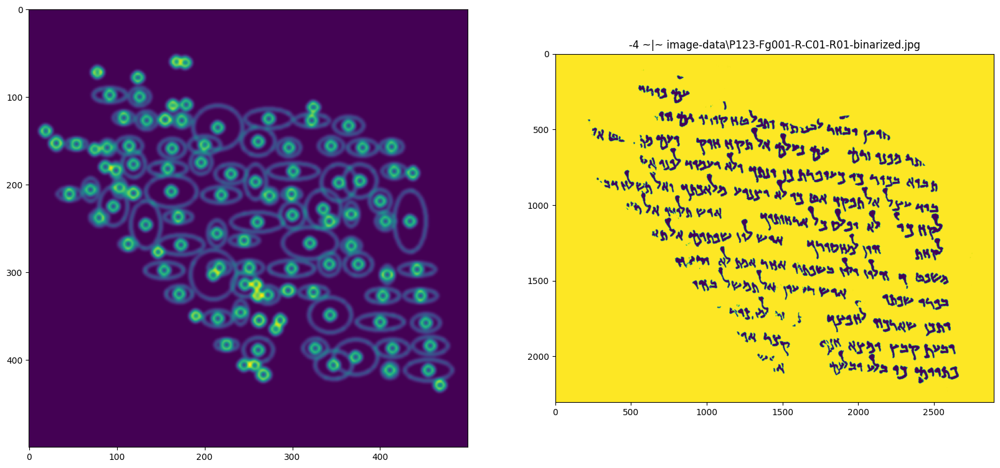

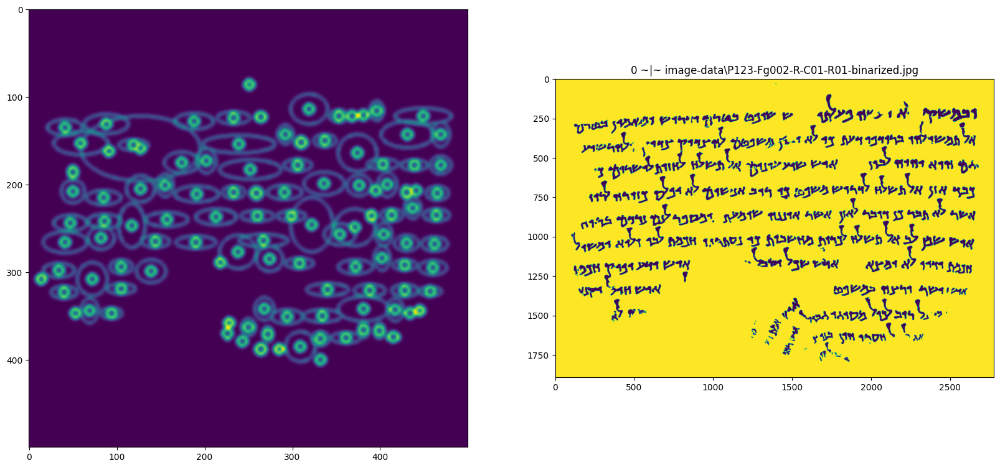

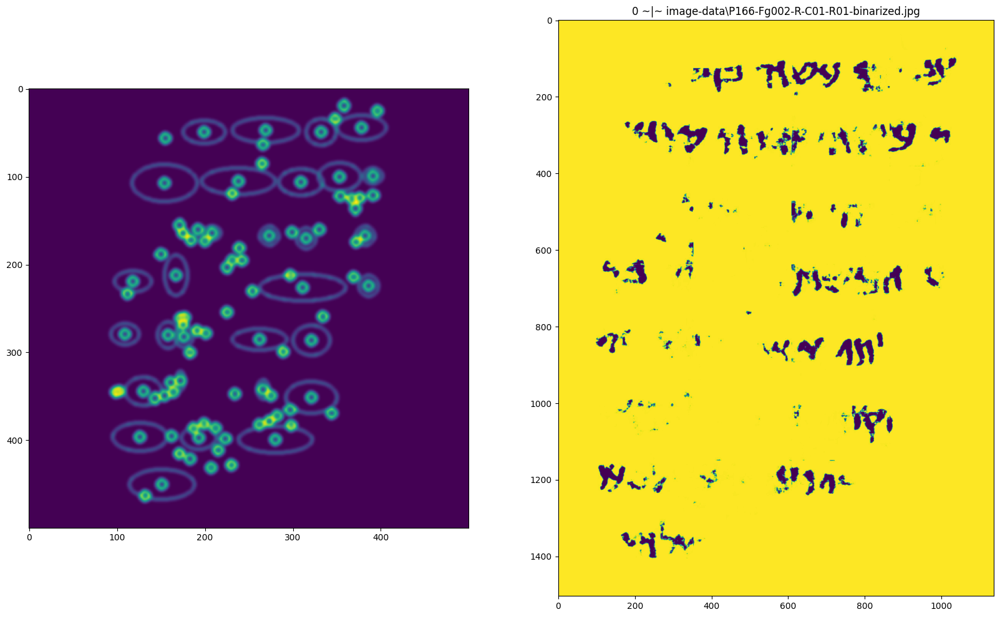

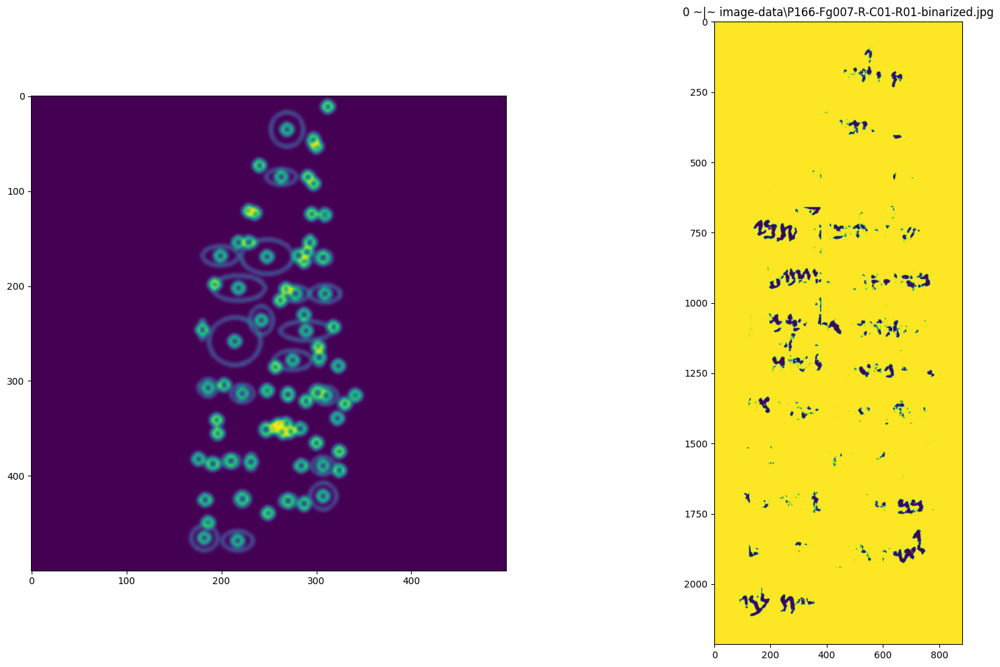

...

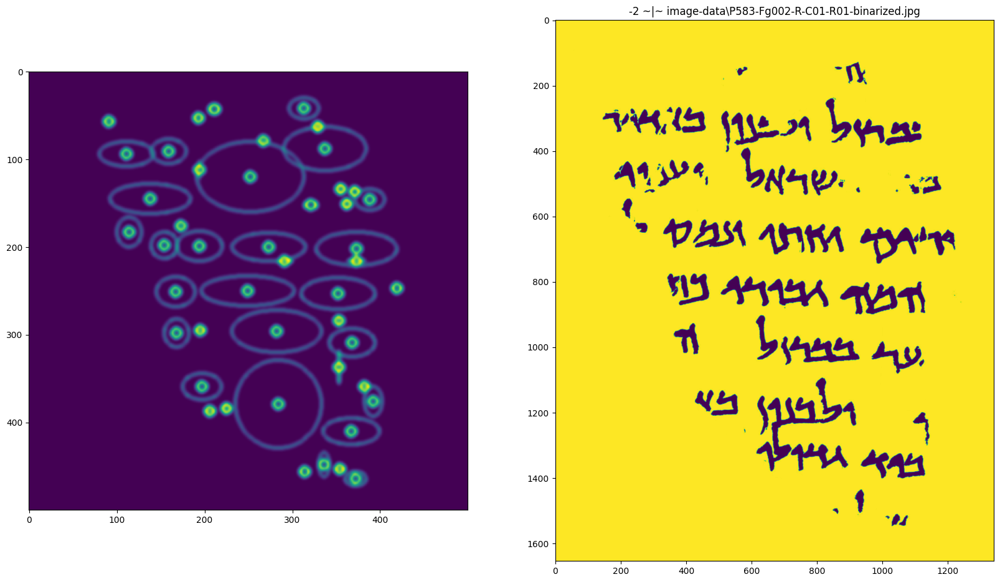

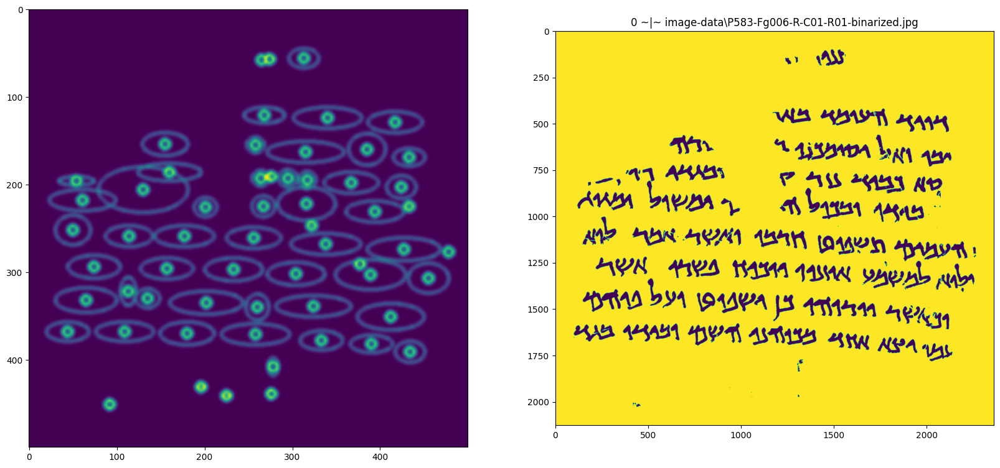

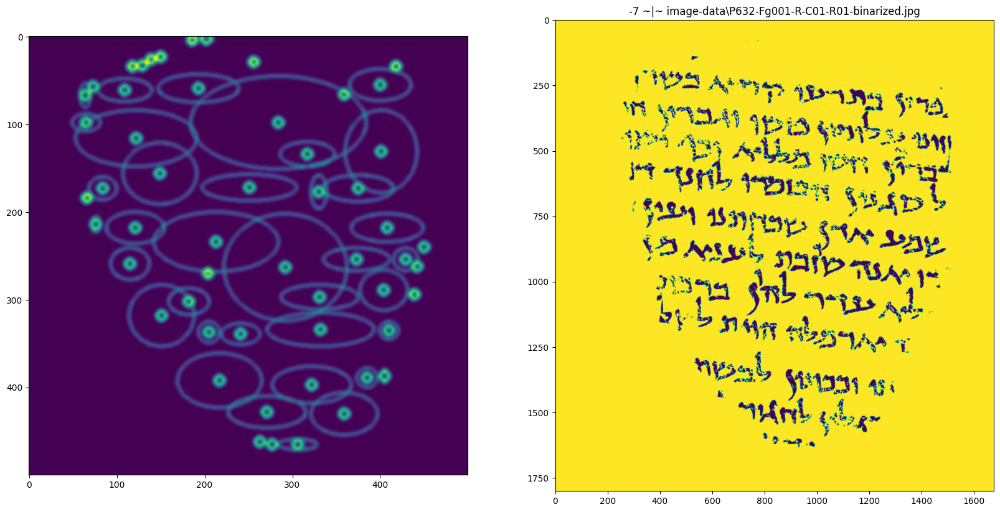

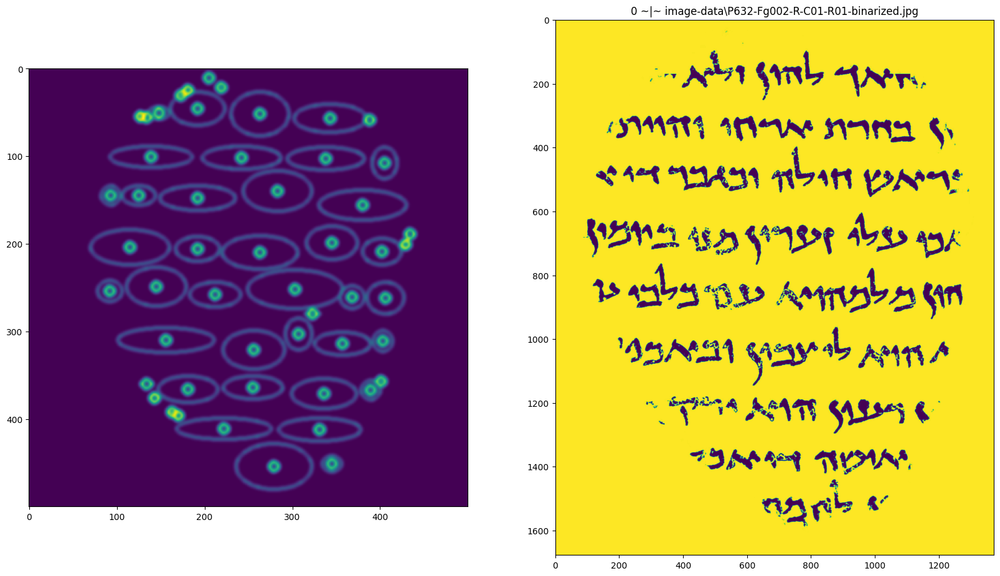

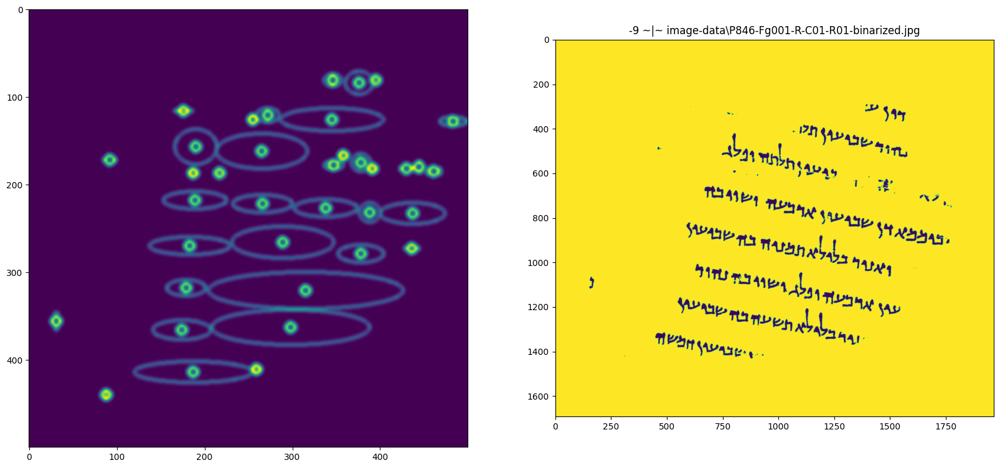

In [13]:
from segmentation.findOptimalRotation import find_optimal_rotation
from segmentFunction import segment_dss_page
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from data_management.augmentation.commonAug import whitespaceRemover, imgResizer
from skimage.transform import rotate

sourceFolder = "image-data"
binaryFiles = []
for filename in os.listdir(sourceFolder):
    if 'binarized' in filename: binaryFiles.append(filename)


for filename in binaryFiles:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,12))

    img_path = os.path.join(sourceFolder, filename)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE) #Read the img
    img = whitespaceRemover(img=img, padding=100)
    #img = cv2.bitwise_not(img)

    blurryboi, best_rotation_angle, rot_image = find_number_of_lines6(img)

    img_to_plot = img.copy()
    rows, cols = img_to_plot.shape
    img_center = (cols / 2, rows / 2)
    
    # this function rotates the original image, with the angle being defined in the counterclockwise
    rotated_image = rotate(img_to_plot, best_rotation_angle, resize=True, cval=1, clip=False, mode ='constant')

    ax1.imshow(blurryboi)
    ax2.imshow(rotated_image)
    plt.title(str(best_rotation_angle) +" ~|~ " + img_path)
    plt.show()

